<a href="https://colab.research.google.com/github/KaairaGupta/Cell-Image-Segmentation-using-Generative-Adversarial-Networks-Transfer-Learning-and-Augmentations/blob/master/TL_GAN_UNET.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import tensorflow as tf 
tf.test.gpu_device_name() 


'/device:GPU:0'

In [0]:
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torchvision.transforms import ToTensor
from torchvision.datasets.folder import IMG_EXTENSIONS
from torchvision import get_image_backend 
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np

%matplotlib inline   


In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
# Batch size during training
batch_size = 2

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 572
# Number of training epochs
num_epochs = 50

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.9

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

nz = 512

ngf=64
ndf=64

nc=3
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")



root='/content/drive/My Drive/Colab Notebooks/Cell Image Segmentation using Generative Adversarial Networks, Transfer Learning, and Augmentations/dataset/annotated/absorbance'

In [0]:
def my_loader(path):
                
    def my_pil_loader(path):
        print ("loading {}".format(path))
        with open(path, 'rb') as f:
            img = Image.open(f)
            return img.convert('RGB')

    if get_image_backend() == 'accimage':
        print('{} uses accimage'.format(path))
        try:
            return accimage_loader(path)
        except IOError:
            print('{} accimage loading fail, using PIL'.format(path))
            return my_pil_loader(path)
    else:
        print('{} uses PIL'.format(path))
        return my_pil_loader(path)


img_ext='tif'

In [0]:
dataset=dset.DatasetFolder(root,my_loader,img_ext,transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                           ]))

dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,shuffle=False)


/content/drive/My Drive/Colab Notebooks/Cell Image Segmentation using Generative Adversarial Networks, Transfer Learning, and Augmentations/dataset/annotated/absorbance/images/20161012-D3C-D73_Blue_stitched-0_n100_r2196_c1007.ome.tif uses PIL
loading /content/drive/My Drive/Colab Notebooks/Cell Image Segmentation using Generative Adversarial Networks, Transfer Learning, and Augmentations/dataset/annotated/absorbance/images/20161012-D3C-D73_Blue_stitched-0_n100_r2196_c1007.ome.tif
/content/drive/My Drive/Colab Notebooks/Cell Image Segmentation using Generative Adversarial Networks, Transfer Learning, and Augmentations/dataset/annotated/absorbance/images/20161012-D3C-D73_Blue_stitched-0_n102_r2197_c1407.ome.tif uses PIL
loading /content/drive/My Drive/Colab Notebooks/Cell Image Segmentation using Generative Adversarial Networks, Transfer Learning, and Augmentations/dataset/annotated/absorbance/images/20161012-D3C-D73_Blue_stitched-0_n102_r2197_c1407.ome.tif


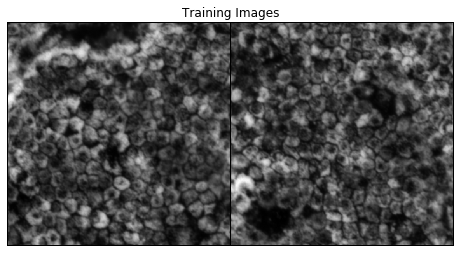

In [0]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [0]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [0]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            
            nn.ConvTranspose2d( nz, ngf * 8, 3, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf*8, ngf * 8, 3, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.Upsample(scale_factor=2),
      
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 3, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 4, 3, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.Upsample(scale_factor=2),

          
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 3, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf * 2, ngf * 2, 3, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.Upsample(scale_factor=2),

            
            nn.ConvTranspose2d( ngf * 2, ngf, 3, 1, 0, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d (ngf, ngf, 3, 1, 0, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            
            nn.ConvTranspose2d( ngf, nc, 1, 1, 0, bias=False),
            nn.Tanh(),          
        )

    def forward(self, input):
        return self.main(input)

In [0]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(512, 512, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 512, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Upsample(scale_factor=2.0, mode=nearest)
    (7): ConvTranspose2d(512, 256, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (8): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): ConvTranspose2d(256, 256, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (11): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): Upsample(scale_factor=2.0, mode=nearest)
    (14): ConvTranspose2d(256, 128, kernel_size=(3, 3), stride=

In [0]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            
            nn.Conv2d(nc, ndf, 3,1,0, bias=False),
            nn.ReLU(True),
            nn.Conv2d(ndf, ndf,3,1,0, bias=False),
            nn.BatchNorm2d(ndf),
            nn.ReLU(True),
            nn.MaxPool2d(2),
          
            nn.Conv2d(ndf, ndf * 2, 3,1,0, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.ReLU(True),
            nn.Conv2d(ndf*2, ndf * 2, 3,1,0, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.ReLU(True),
            nn.MaxPool2d(2),
        
            nn.Conv2d(ndf * 2, ndf * 4, 3,1,0, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.ReLU(True),
            nn.Conv2d(ndf * 4, ndf * 4, 3,1,0, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.ReLU(True),
            nn.MaxPool2d(2),
        
            nn.Conv2d(ndf * 4, ndf * 8, 3,1,0, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.ReLU(True),
            nn.Conv2d(ndf * 8, 1, 3,1,0, bias=False),
            nn.Sigmoid(),
            nn.MaxPool2d(64)
        )

    def forward(self, input):
        output= self.main(input)
        return output

In [0]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
    
# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (13): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (14): BatchNorm2d(256, eps=1e-05, momentum=0.1,

In [0]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(batch_size, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = (-0.1) * torch.rand(1).item() + 1
fake_label = (-0.1) * torch.rand(1).item() + 0.1

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [0]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = (real_cpu.size(0))
        label = torch.full((b_size,), real_label, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu)
        print(len(output))
        print(output)
        print(output.shape)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 64, 64, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()
        
        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1

Starting Training Loop...
/content/drive/My Drive/Colab Notebooks/Cell Image Segmentation using Generative Adversarial Networks, Transfer Learning, and Augmentations/dataset/annotated/absorbance/images/20161012-D3C-D73_Blue_stitched-0_n100_r2196_c1007.ome.tif uses PIL
loading /content/drive/My Drive/Colab Notebooks/Cell Image Segmentation using Generative Adversarial Networks, Transfer Learning, and Augmentations/dataset/annotated/absorbance/images/20161012-D3C-D73_Blue_stitched-0_n100_r2196_c1007.ome.tif
/content/drive/My Drive/Colab Notebooks/Cell Image Segmentation using Generative Adversarial Networks, Transfer Learning, and Augmentations/dataset/annotated/absorbance/images/20161012-D3C-D73_Blue_stitched-0_n102_r2197_c1407.ome.tif uses PIL
loading /content/drive/My Drive/Colab Notebooks/Cell Image Segmentation using Generative Adversarial Networks, Transfer Learning, and Augmentations/dataset/annotated/absorbance/images/20161012-D3C-D73_Blue_stitched-0_n102_r2197_c1407.ome.tif
2
te

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:498: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1, 1, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)


[0/50][0/516]	Loss_D: 3.5156	Loss_G: 0.0787	D(x): 0.9897	D(G(z)): 0.9717 / 0.9440
/content/drive/My Drive/Colab Notebooks/Cell Image Segmentation using Generative Adversarial Networks, Transfer Learning, and Augmentations/dataset/annotated/absorbance/images/20161012-D3C-D73_Blue_stitched-0_n103_r2197_c1607.ome.tif uses PIL
loading /content/drive/My Drive/Colab Notebooks/Cell Image Segmentation using Generative Adversarial Networks, Transfer Learning, and Augmentations/dataset/annotated/absorbance/images/20161012-D3C-D73_Blue_stitched-0_n103_r2197_c1607.ome.tif
/content/drive/My Drive/Colab Notebooks/Cell Image Segmentation using Generative Adversarial Networks, Transfer Learning, and Augmentations/dataset/annotated/absorbance/images/20161012-D3C-D73_Blue_stitched-0_n104_r2197_c1808.ome.tif uses PIL
loading /content/drive/My Drive/Colab Notebooks/Cell Image Segmentation using Generative Adversarial Networks, Transfer Learning, and Augmentations/dataset/annotated/absorbance/images/201610

In [0]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [0]:
#%%capture
from IPython.display import HTML
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [0]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()